# IMA207 - Practical work on SAR statistics

### Emanuele DALSASSO, Florence TUPIN, Cristiano ULONDU MENDES, Thomas BULTINGAIRE

### Statistics and despeckling

The practical work is divided in 3 parts

- A. empirical checking of the distributions seen in course for synthetic speckle
- B. computation of equivalent number of looks using images of physically homogeneous areas
- C. spatial multi-looking and implementation of the Lee filter

You have at your disposal several images of various areas acquired by different acquisition modes.
- An oceanfront in São-Paulo acquired by Sentinel-1 sensor (ESA) in GRD (Ground Range Detected) mode
- A farmland near from Bologne (Italy) acquired by TerraSAR-X sensor (ESA) in MGD (Multi Look Ground Range Detected) mode
- An area near from Rome acquired by TerraSAR-X sensor (ESA) in SLC (Single Look Complex) mode
- A temporal stack of images acquired at Flevoland in Netherlands by Alos sensor (JAXA) in SLC mode

Some useful functions are available in the file *mvalab.py*.

### Name: **Adnane El Bouhali**

#### Instructions

To solve this practical session, answer the questions below. Then export the notebook with the answers using the menu option **File -> Download as -> Notebook (.ipynb)**. Then [submit the resulting file on e-campus by next week.

### Import the libraries and packages we are going to use
The following cell imports all that is going to be necessary for the practical work

In [1]:
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/mvalab.py

--2024-06-11 12:46:55--  https://perso.telecom-paristech.fr/tupin/TPSAR/mvalab.py
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 137.194.22.227, 2a04:8ec0:0:a::89c2:16e3
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|137.194.22.227|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68071 (66K) [text/x-python]
Saving to: ‘mvalab.py’

mvalab.py           100%[===================>]  66.48K  --.-KB/s    in 0.1s    

2024-06-11 12:46:56 (466 KB/s) - ‘mvalab.py’ saved [68071/68071]



In [2]:
import scipy
from scipy import signal
import scipy.signal
import scipy as spy
import scipy.fftpack
from scipy import ndimage
from scipy import special
from scipy import ndimage
import numpy as np
import math
import matplotlib.pyplot as plt
import mvalab as mvalab
from urllib.request import urlopen
import cmath

plt.rcParams['figure.figsize'] = [15, 15]
plt.rcParams['figure.max_open_warning'] = 30

## A. Single look data distributions

In this part, we will simulate an SLC (Single Look Complex) SAR image representing an homogeneous area and analyze the pdfs of its intensity and phase.

#### Single look data simulation

According to the Goodman model, the real and imaginary parts of each pixel of an SLC SAR image are independent and identically distributed according to a Gaussian distribution centered and of variance equal to the reflectivity of the pixel divided by 2.\
Choose randomly a reflectity value $R$ in the interval $[100, 200]$ and create a SLC SAR image of size $150\times 150$ representing an homogeneous area of reflectivity $R$.

Affichage d'une image reelle
plt.show dans visusar : image 150 x 150


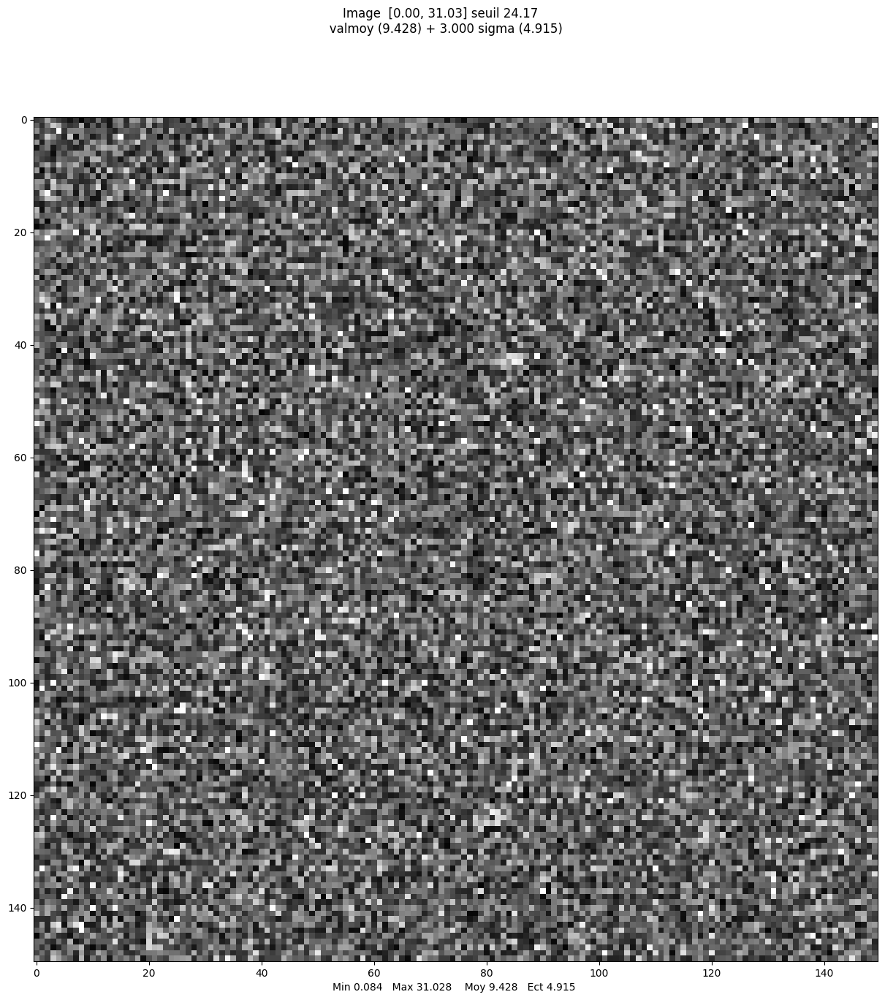

array([[ 5.58683685,  6.83845404, 15.8136197 , ..., 10.31990752,
         5.99869602,  9.52129423],
       [ 9.34046996,  4.49601264, 11.21595193, ...,  2.42209472,
         7.55407463, 24.17170947],
       [13.2738689 ,  6.248995  ,  9.00305427, ...,  5.89292887,
        14.01705169,  8.50747806],
       ...,
       [ 9.55294264,  5.15815179,  9.62260615, ..., 11.05256323,
         7.73482854,  4.49907911],
       [ 6.55896321, 10.65204782,  6.36096686, ...,  8.33025924,
        11.58688367,  7.40097655],
       [13.85348607,  8.16932712,  5.66916322, ...,  4.79835716,
         8.34076029,  9.77329082]])

In [3]:
# Chose the reflectivity of the homogeneous area
R = np.random.uniform(100, 200) #complete

# Simulate the corresponding SLC image
real_part = np.random.normal(0, np.sqrt(R/2), (150, 150))
imaginary_part = np.random.normal(0, np.sqrt(R/2), (150, 150))
ima_slc = real_part + 1j * imaginary_part #complete
mvalab.visusar(np.abs(ima_slc))

#### Data distributions for an homogeneous area

compute the distribution of the phase and intensity of your image.
Then, estimate the coefficient of variation:  
$\gamma=\frac{\sigma}{\mu}$ using intensity data (square of the modulus of the complex field)

In [4]:
# Compute the intensity and the phase
ima_int = ima_int = np.abs(ima_slc)**2 #complete
ima_ph = np.angle(ima_slc) #complete

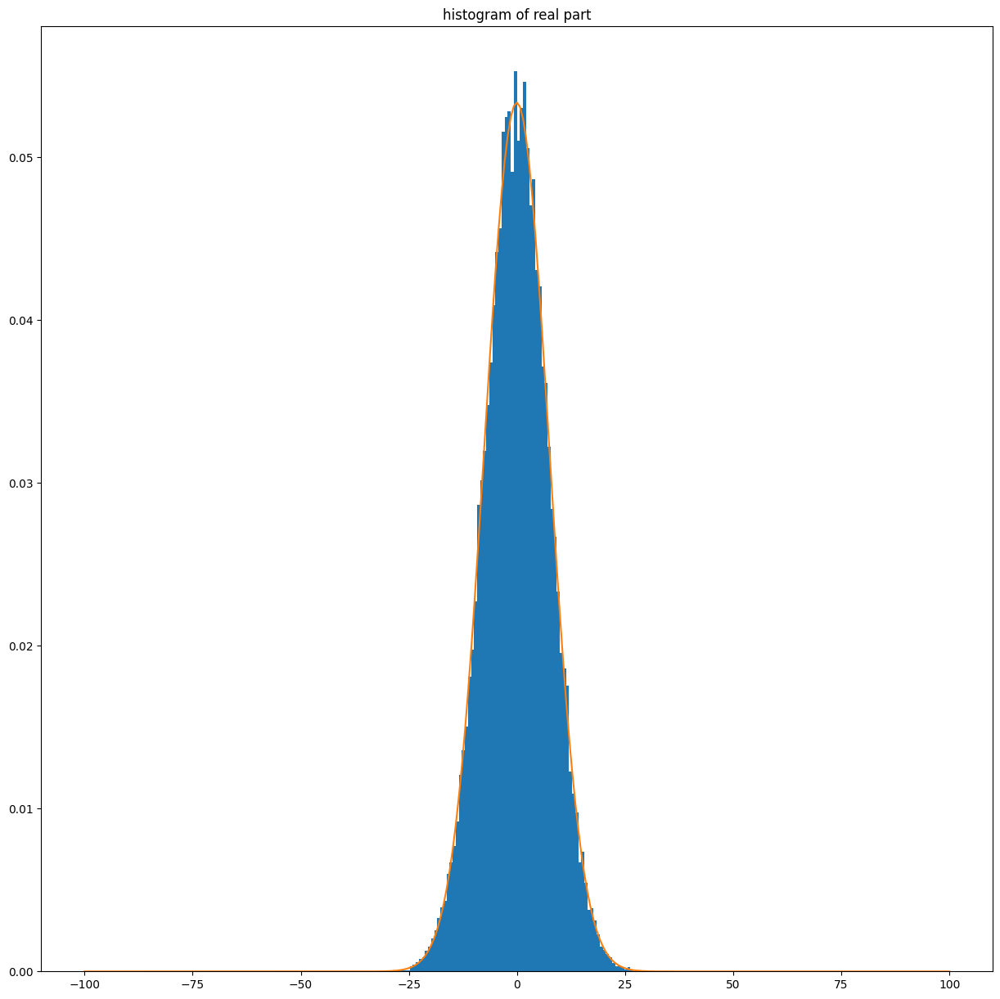

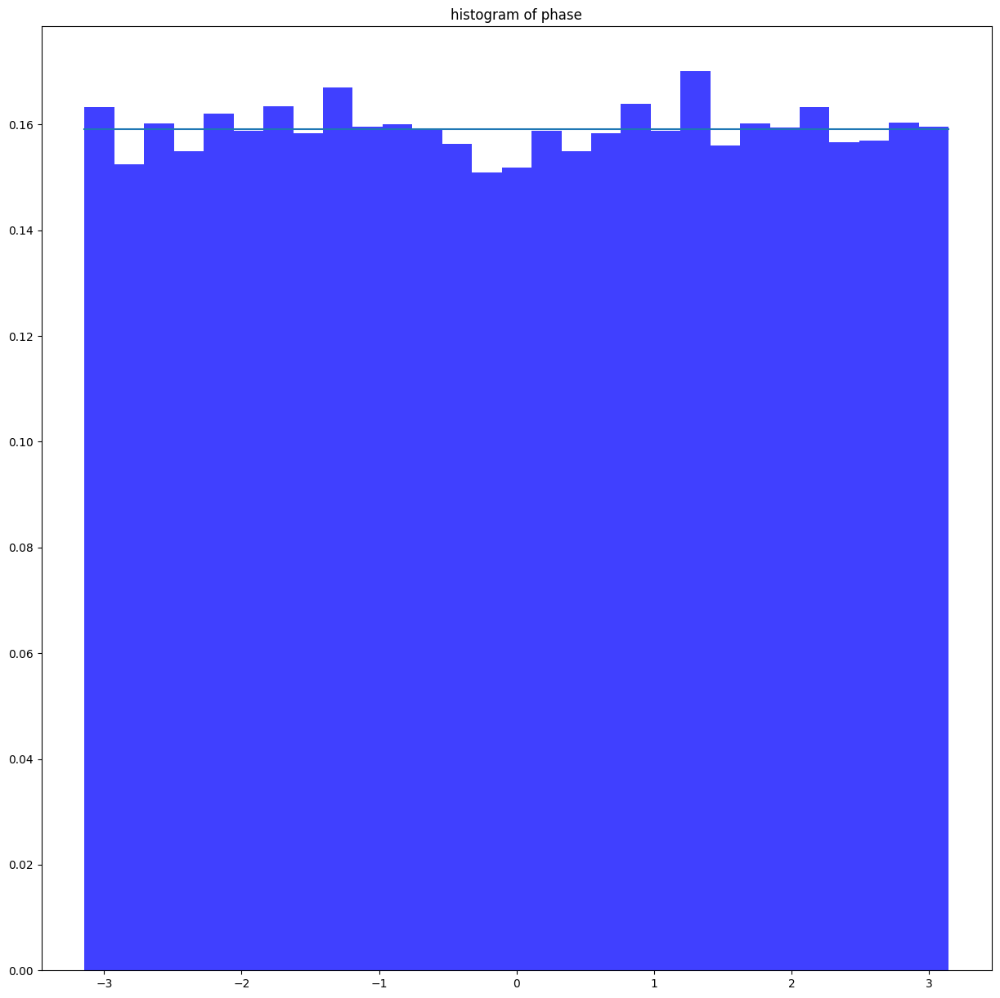

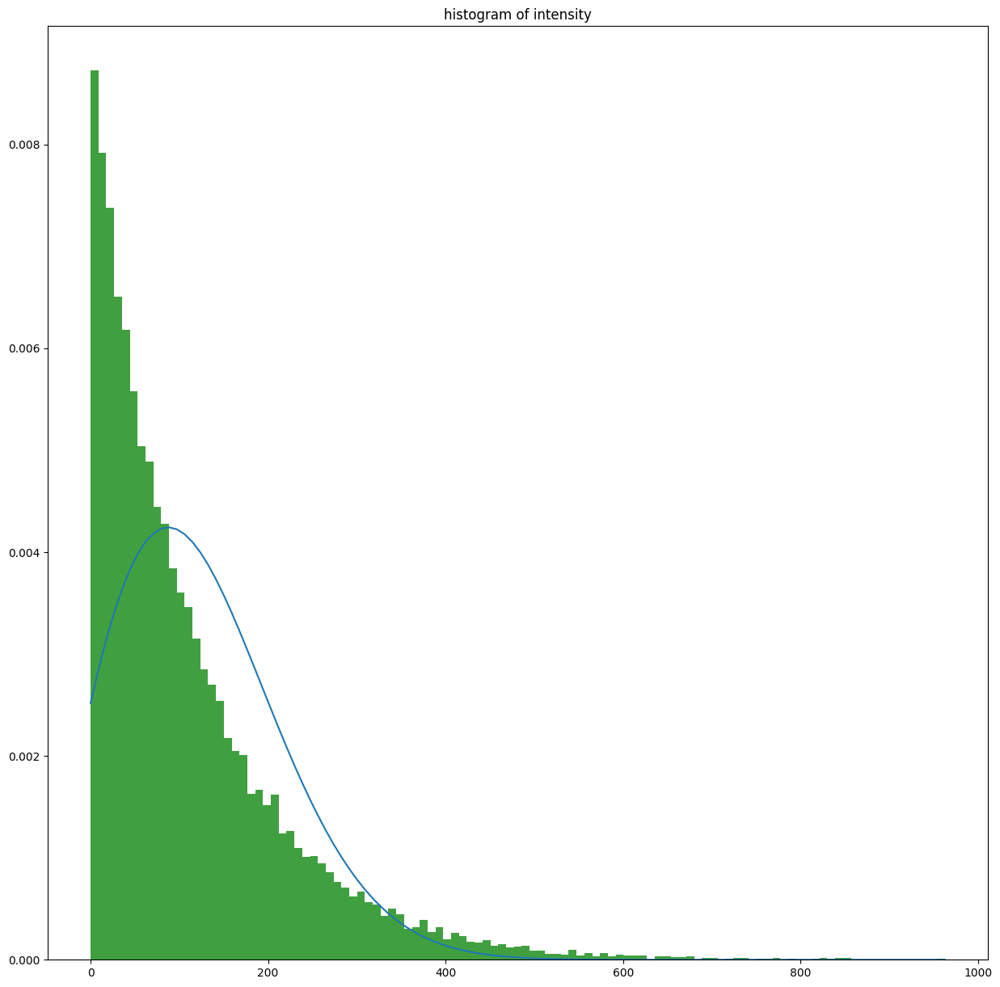

In [6]:
# Plot the histograms and verify they match the theoretical distribution
# Use the right range of values to plot the histogram
# Choose the right distribution to do the fitting

# fitting of the distributions
# use the following ones :
# Gaussian pdf : scipy.stats.uniform
# Rayleigh pdf : scipy.stats.rayleigh
# Exponential pdf : scipy.stats.expon

#example for real part of the data
plt.figure()
_, bins, _ = plt.hist(np.real(ima_slc).ravel(),bins='auto',density=True,range=[-100,100])  # Gaussian distribution
mu, sigma = scipy.stats.norm.fit(np.real(ima_slc))
best_fit_line = scipy.stats.norm.pdf(bins, mu, sigma)
plt.plot(bins, best_fit_line)
plt.title('histogram of real part')
plt.show()


#complete for phase data: Uniform distribution
plt.figure()
_, bins, _ = plt.hist(np.angle(ima_slc).ravel(), bins='auto', density=True, range=[-np.pi, np.pi], alpha=0.75, color='blue')
loc, scale = -np.pi, 2*np.pi  # Parameters for uniform distribution from -π to π
best_fit_line = scipy.stats.uniform.pdf(bins, loc, scale) #complete
plt.plot(bins, best_fit_line)
plt.title('histogram of phase')
plt.show()


#complete for intensity data: Exponential (Gamma) distribution
plt.figure()
_, bins, _ = plt.hist((np.abs(ima_slc)**2).ravel(), bins='auto', density=True, alpha=0.75, color='green')
param = scipy.stats.rayleigh.fit((np.abs(ima_slc)**2).ravel())  # Fit a Rayleigh distribution
best_fit_line = scipy.stats.rayleigh.pdf(bins, *param) #complete
plt.plot(bins, best_fit_line)
plt.title('histogram of intensity')
plt.show()

In [7]:
# Compute the coefficient of variation on the homogeneous area in intensity

m_I = np.mean(np.abs(ima_slc)**2) #complete
sigma_I = np.std(np.abs(ima_slc)**2) #complete
coeff_var_I = sigma_I/m_I
print(coeff_var_I)

0.9875603629512423


### Question A.1.

Did you find the distributions seen in the course ? (recapitulate them).
Did you find the correct value for the coefficient of variation ? Could this coefficient be less than the theoretical value ?

### Answer A.1.

The distributions observed align with those discussed in the course. Both the real and imaginary parts follow a Gaussian distribution, the phase is uniformly distributed, the amplitude adheres to a Rayleigh distribution, and the intensity conforms to a Gamma distribution.

As anticipated, the coefficient of variation is confirmed to be close to 1.

## B. Computation of the Equivalent Number of looks on homogeneous areas
In this part you have at your disposal 2 images of a part a ocean (São-Paulo) and a part of a field (Bologne, Italy). The first is acquired by Sentinel-1 GRD, and the second by TerraSAR-X GRD. The multi-looking has been done by the data provider (ESA, European Space Agency).

Use the value of the coefficient of variation to find the Equivalent Number of Looks (ENL) of the Sentinel-1 GRD and TerraSAR-X GRD data.
The formula is :
- $\gamma_I=\frac{1}{\sqrt{L}}$ for intensity data

In [8]:
# Download the images
!wget "https://partage.imt.fr/index.php/s/M3yeW5ozcsHyigR/download/s1_grd_saopaulo.npy"
!wget "https://partage.imt.fr/index.php/s/TTRfS6XKCzSM6cS/download/tsx_grd_bologne.npy"

--2024-06-11 13:37:48--  https://partage.imt.fr/index.php/s/M3yeW5ozcsHyigR/download/s1_grd_saopaulo.npy
Resolving partage.imt.fr (partage.imt.fr)... 193.48.235.12
Connecting to partage.imt.fr (partage.imt.fr)|193.48.235.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2097280 (2.0M) [application/octet-stream]
Saving to: ‘s1_grd_saopaulo.npy’

s1_grd_saopaulo.npy 100%[===================>]   2.00M   424KB/s    in 4.8s    

2024-06-11 13:37:54 (424 KB/s) - ‘s1_grd_saopaulo.npy’ saved [2097280/2097280]

--2024-06-11 13:37:54--  https://partage.imt.fr/index.php/s/TTRfS6XKCzSM6cS/download/tsx_grd_bologne.npy
Resolving partage.imt.fr (partage.imt.fr)... 193.48.235.12
Connecting to partage.imt.fr (partage.imt.fr)|193.48.235.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2097280 (2.0M) [application/octet-stream]
Saving to: ‘tsx_grd_bologne.npy’

tsx_grd_bologne.npy 100%[===================>]   2.00M   424KB/s    in 4.8s    

2024-06-11

Affichage d'une image reelle
plt.show dans visusar : image 250 x 250


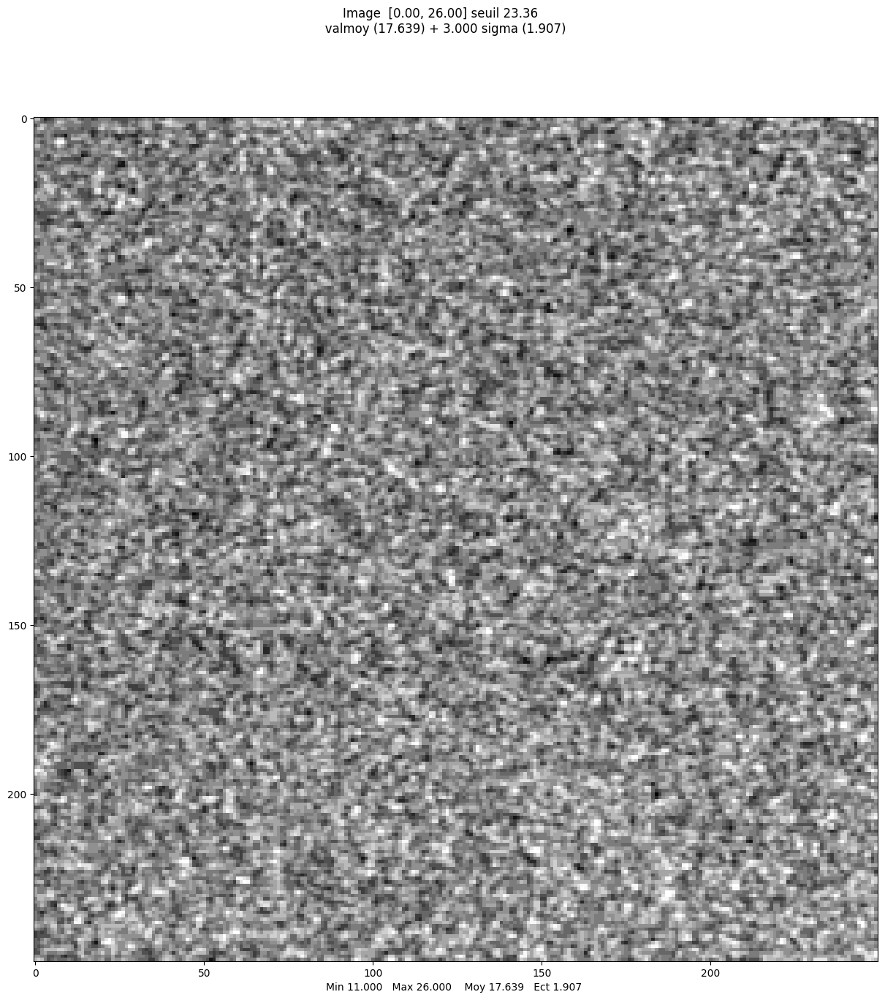

--- coeff var and L ---
0.21648477
21.33758686719461


In [10]:
im_s1grd = np.load("s1_grd_saopaulo.npy").astype(np.float32) #amplitude
im_s1grd_mer = im_s1grd[50:300, 100:350]
mvalab.visusar(im_s1grd_mer)

# compute coefficient of variation and number of looks
coeff_var_grd = np.std(im_s1grd_mer ** 2)  / np.mean(im_s1grd_mer ** 2) #complete

L_grd = 1 / (coeff_var_grd ** 2) #complete
print('--- coeff var and L ---')
print(coeff_var_grd)
print(L_grd)

Affichage d'une image reelle
plt.show dans visusar : image 250 x 250


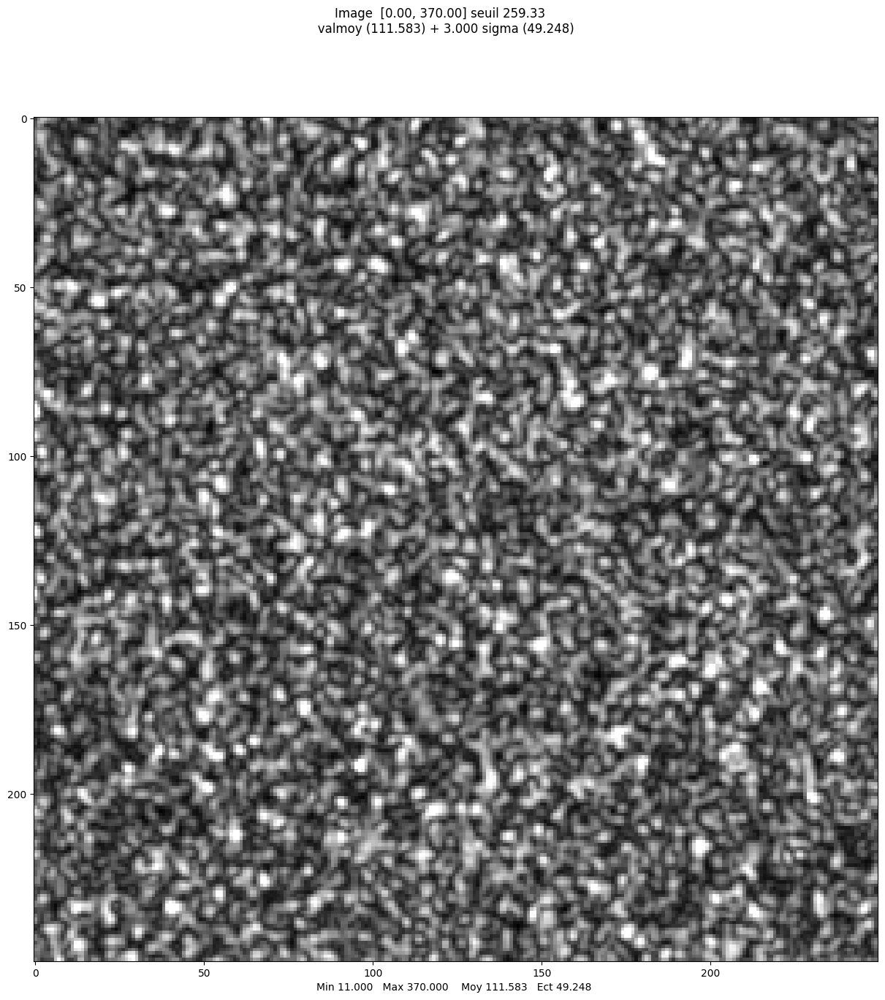

--- coeff var and L ---
0.90074235
1.2325337872691504


In [11]:
im_tsxgrd = np.load("tsx_grd_bologne.npy").astype(np.float32) #amplitude
im_tsxgrd_champ = im_tsxgrd[700:950, 300:550]
mvalab.visusar(im_tsxgrd_champ)

# compute coefficient of variation and number of looks

coeff_var_tsx = np.std(im_tsxgrd_champ ** 2) / np.mean(im_tsxgrd_champ ** 2)

L_tsx = 1 / (coeff_var_tsx ** 2)

print('--- coeff var and L ---')
print(coeff_var_tsx)
print(L_tsx)

### Question B.1
Comment the number of looks you have found for GRD date from Sentinel-1 and TerraSAR-X (is it an integer value ? why not ? what does it mean ?).

### Answer B.1

The analysis of the Equivalent Number of Looks (ENL) for Sentinel-1 and TerraSAR-X GRD data provides insight into the image quality and noise levels of each sensor:

- **Sentinel-1 GRD (Ocean Area)** demonstrates a low coefficient of variation and a high ENL of 21.34, indicating significant noise reduction through multi-looking. This results in a uniform and reliable backscatter signal, ideal for consistent, broad-area monitoring such as ocean studies.

- **TerraSAR-X GRD (Farmland Area)**, with a higher coefficient of variation and a lower ENL of 1.23, shows minimal noise averaging. This preserves fine details at the cost of higher noise levels, making it suitable for high-resolution applications where detail is crucial, such as precision farming.

The non-integer values of ENL reflect its basis in continuous statistical measures rather than discrete processes, emphasizing its role as an indicator of noise reduction effectiveness in SAR imagery.

## C. Spatial multi-looking and implementation of the Lee filter

In this part we will try simple speckle reduction method using the following step :
- first we will compute a mean filter
- then we will compute the local coefficient of variation (using the same size for the moving window)
- finally we will combine these two results to obtain the Lee filter.

## C.1 Computation of the mean filter
Compute the mean filter using a 2D convolution.

In [12]:
# Download the image
!wget "https://partage.imt.fr/index.php/s/cbRqjnSJEfD2zJ8/download/tsx_slc_rome.npy"

--2024-06-11 14:41:11--  https://partage.imt.fr/index.php/s/cbRqjnSJEfD2zJ8/download/tsx_slc_rome.npy
Resolving partage.imt.fr (partage.imt.fr)... 193.48.235.12
Connecting to partage.imt.fr (partage.imt.fr)|193.48.235.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8388736 (8.0M) [application/octet-stream]
Saving to: ‘tsx_slc_rome.npy’

tsx_slc_rome.npy    100%[===================>]   8.00M   435KB/s    in 19s     

2024-06-11 14:41:31 (430 KB/s) - ‘tsx_slc_rome.npy’ saved [8388736/8388736]



<ipython-input-13-7e631dfdd0a8>:3: ComplexWarning: Casting complex values to real discards the imaginary part
  ima_tsxslc = np.load("tsx_slc_rome.npy").astype(np.float32)  #amplitude


Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


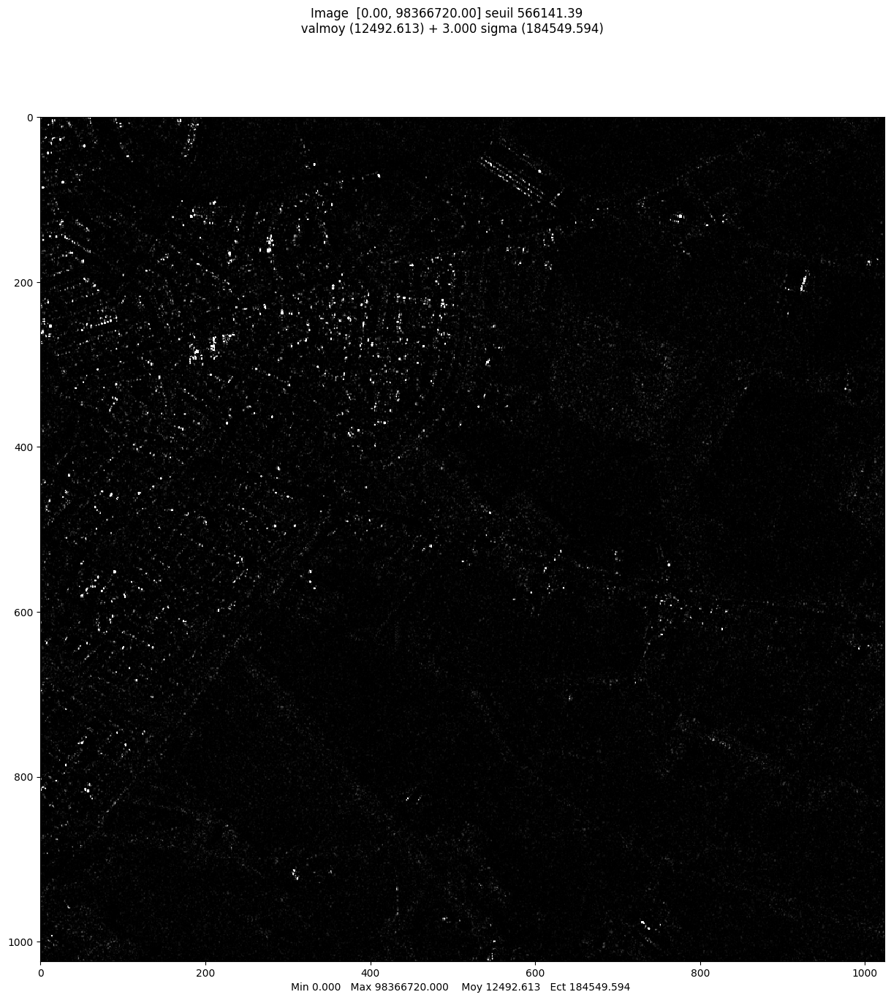

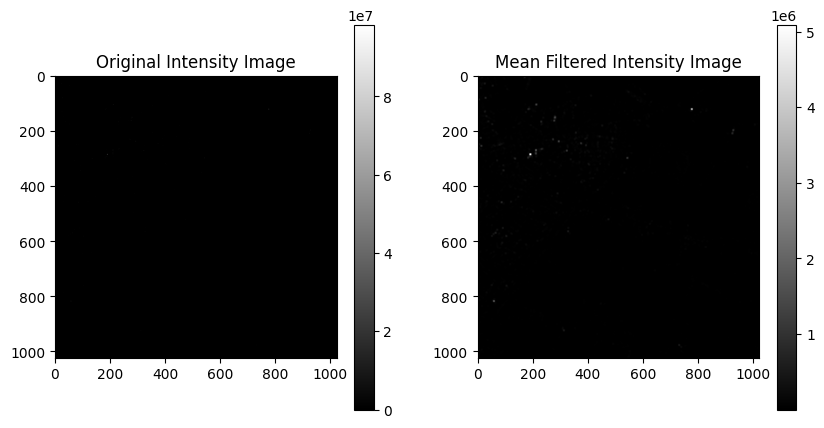

In [13]:
from scipy.signal import convolve2d

ima_tsxslc = np.load("tsx_slc_rome.npy").astype(np.float32)  #amplitude

# take the intensity
ima_int = ima_tsxslc**2 #complete
mvalab.visusar(ima_int)

# create the average window
size_window = 7
mask_loc = np.ones((size_window, size_window)) / (size_window**2) #complete

# compute the mean image (intensity data)
ima_int_mean = convolve2d(ima_int, mask_loc, mode='same', boundary='wrap') #complete

# display the result
plt.figure(figsize=(10, 5))
plt.subplot(121)
plt.imshow(ima_int, cmap='gray')
plt.colorbar()
plt.title('Original Intensity Image')

plt.subplot(122)
plt.imshow(ima_int_mean, cmap='gray')
plt.colorbar()
plt.title('Mean Filtered Intensity Image')
plt.show()

### Question C.1
What is the effect of the mean filter ? (advantages and drawbacks). What is the influence of the window size ?

### Answer C.1

The mean filter is a basic yet effective image processing tool primarily used for noise reduction, particularly for diminishing speckle noise in SAR imagery. The main advantage of using a mean filter is its simplicity and efficiency, which facilitates quick noise smoothing across images. However, this comes at the cost of blurring important details and edges, which can degrade image resolution and obscure fine features essential for detailed analysis.

The size of the window used in the mean filter greatly influences its effectiveness and impact:
- **Larger windows** enhance the smoothing effect, making them suitable for noisier images but at the risk of significant blurring, which may be detrimental for applications requiring high detail.
- **Smaller windows** preserve more details and sharpness but are less effective at reducing noise, which could leave residual speckle that affects the visual and analytical quality of the image.

In applications where detail preservation is as crucial as noise reduction, adaptive filtering methods like the Lee filter, which dynamically adjusts the amount of smoothing based on local characteristics of the image, may offer a superior alternative to the mean filter. This approach helps maintain a balance between reducing noise and preserving critical image details.

## C.2 Lee filter

Given a neighborhood, the Lee filter of an image $I_s$ can be computed by the following steps:

*   Compute the local mean of the image $\hat{\mu}_{s}$
*   Compute $k_s$ given by:
$$
  k_s=1- \frac{\gamma_{Sp}^2}{\hat{\gamma}_s^2}
$$
where $\gamma_{Sp}$ is the theoretical value of the coefficient of variation for a pure speckle ($\gamma_{Sp}=\frac{1}{\sqrt{L}}$ for a L-look intensity image), and $\hat{\gamma}_s$ is the empirical value of the coefficient of variation for the given neighborhood.
*   Compute the final filtered image
$$
  \hat{I}_s= \hat{\mu}_{s}+k_s (I_s-\hat{\mu}_{s})
$$

Create a function performing Lee filter on an image, for a given neighborhood and number $L$ of look.

Then, knowing that a SLC image is a 1-look image, compute the Lee filter on the intensity image of "ima_tsxslc"

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


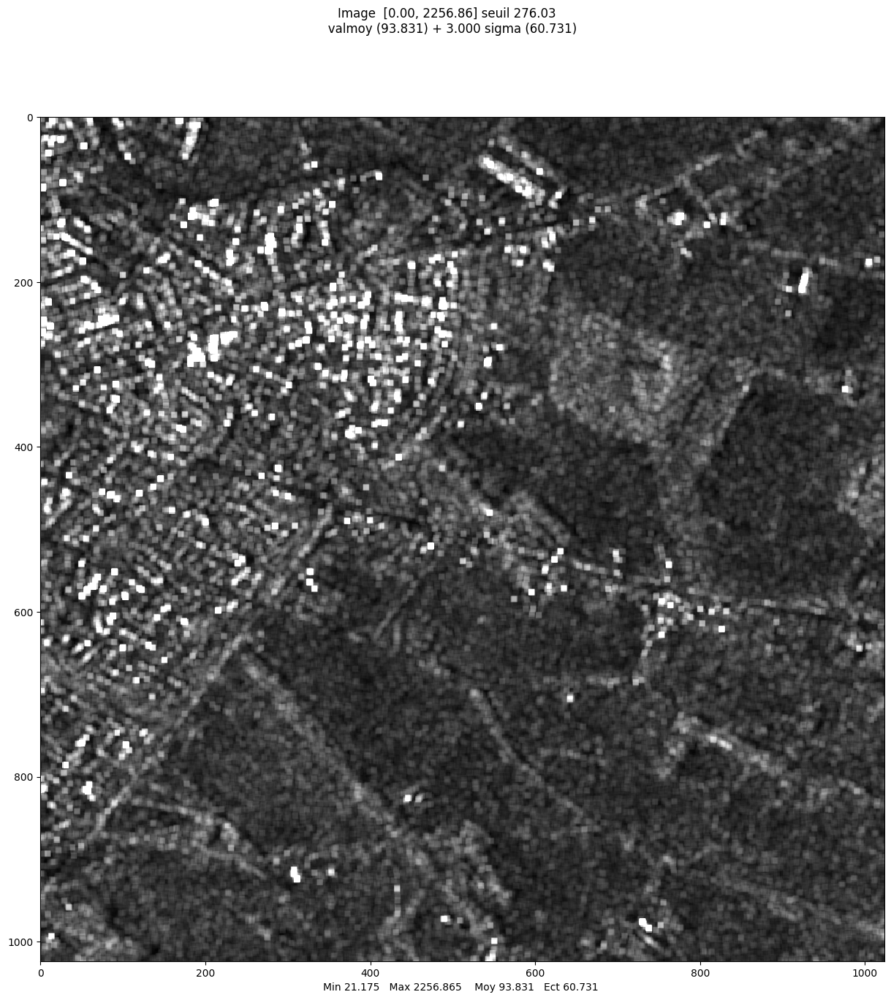

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


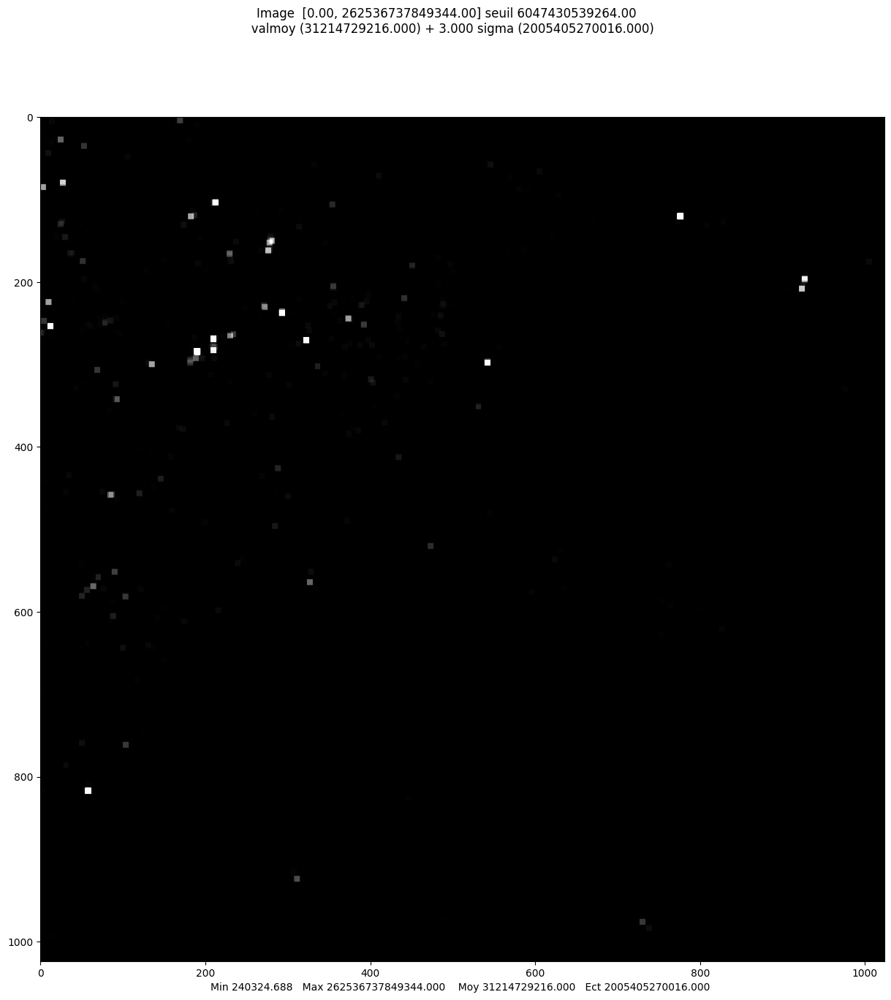

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


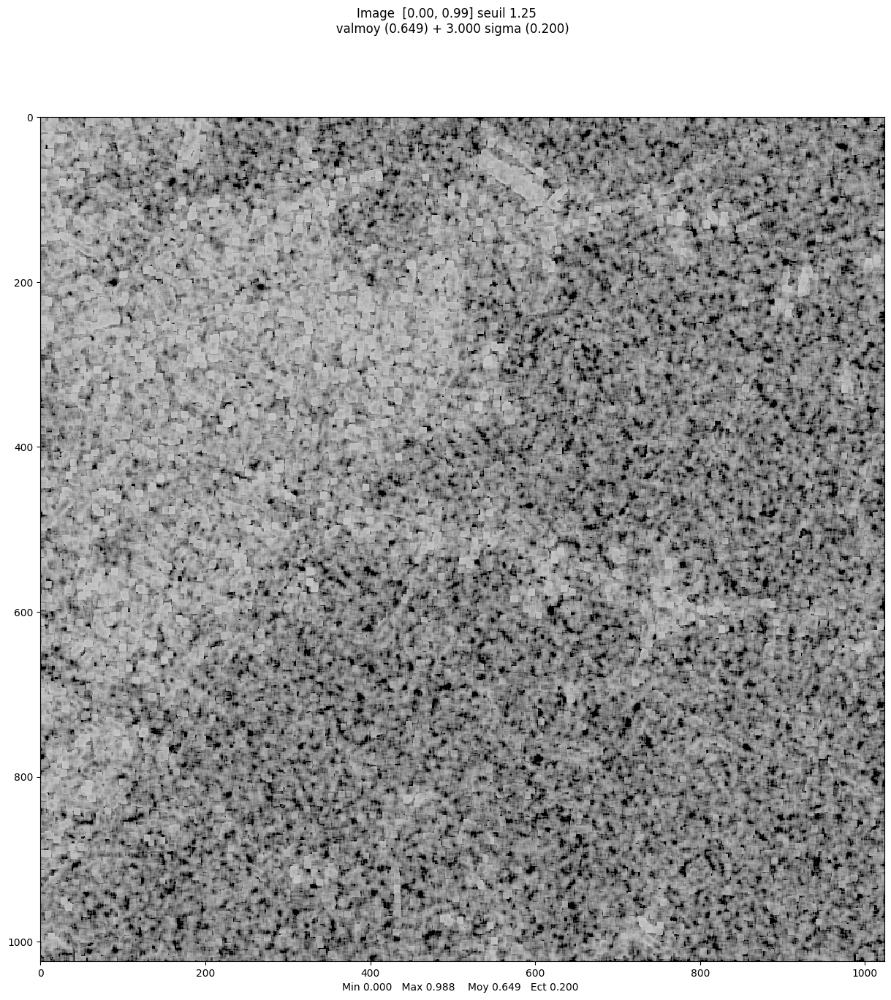

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


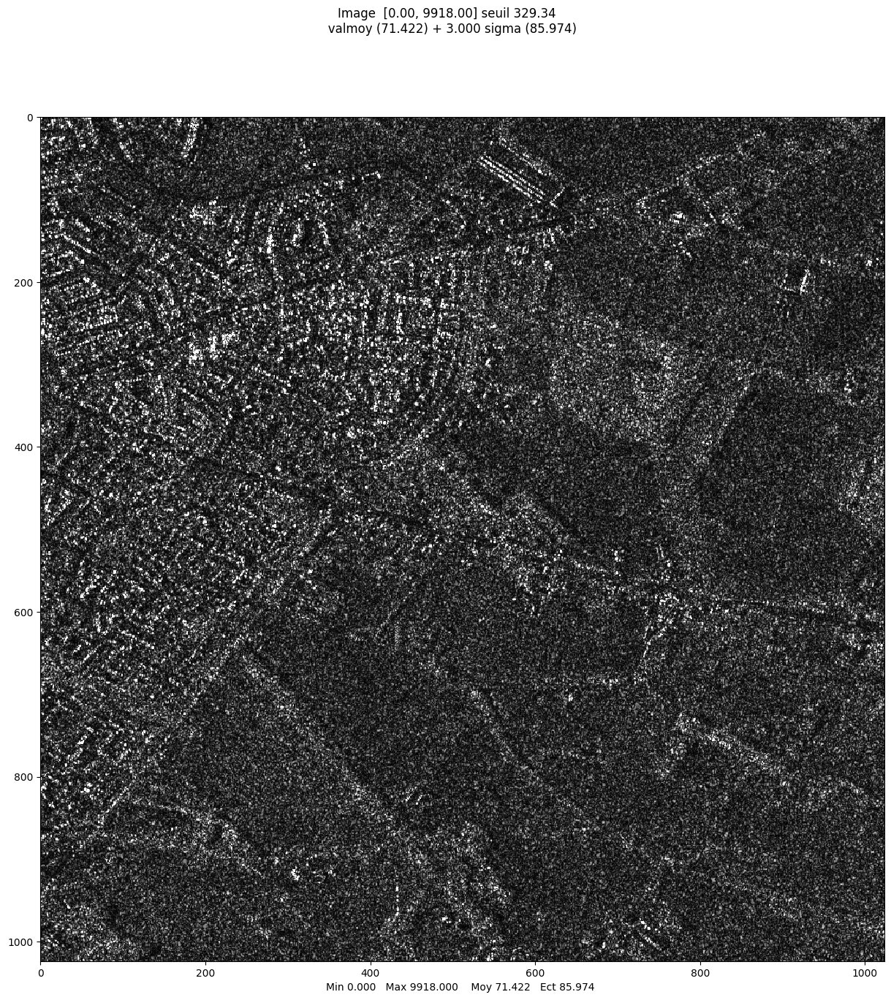

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


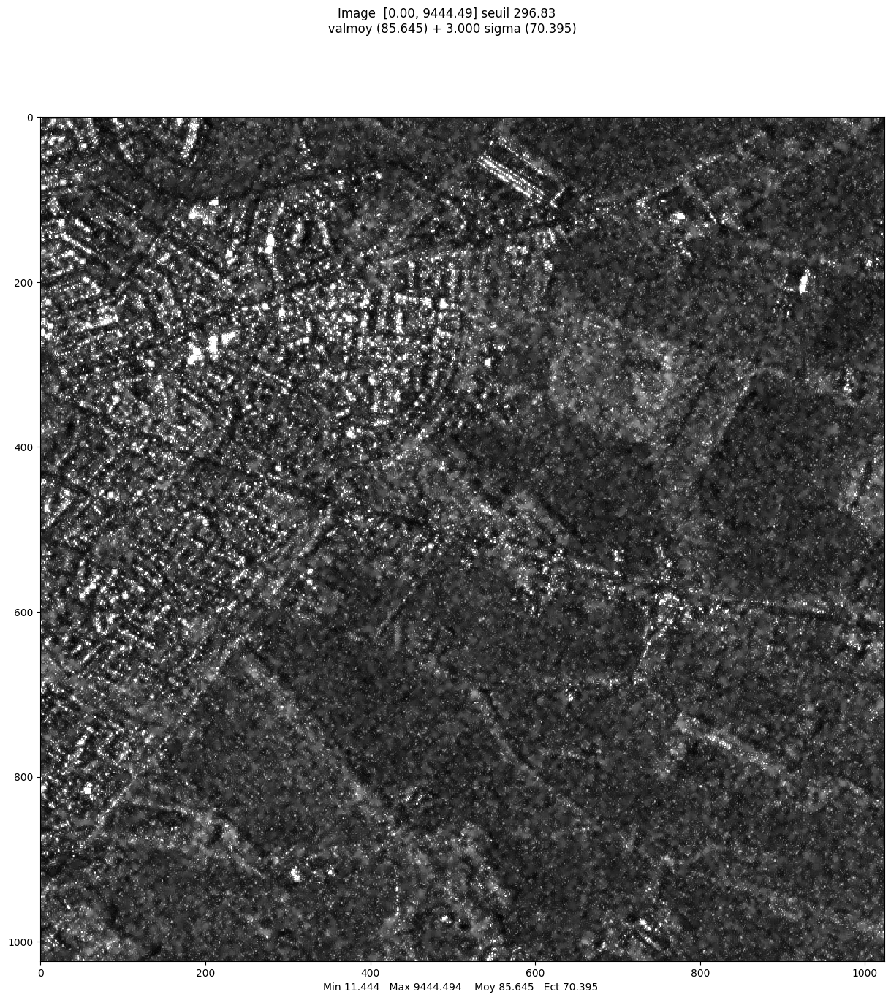

array([[192.67274475, 153.03477478, 153.26098633, ...,  39.9510498 ,
         32.51806259,  83.72267914],
       [188.79986572, 296.83066559, 296.83066559, ...,  48.59766769,
         45.77035522,  31.54861832],
       [217.90916443, 296.83066559, 254.03015137, ...,  51.85850143,
         34.79203033,  32.2634964 ],
       ...,
       [ 55.07465744,  48.61314774,  57.42618561, ...,  77.89130402,
         64.89191437,  48.19029617],
       [ 54.89356232,  82.01906586,  61.65065384, ...,  63.85507202,
         49.72206116,  56.66182327],
       [ 60.01028824,  56.11188889,  54.58663559, ...,  63.71235657,
         49.4493866 ,  64.79956055]])

In [17]:
from scipy.ndimage import uniform_filter

def lee_filter(im, neighborhood=7, L=1, visualize=False):

  size = (neighborhood, neighborhood)

  # Compute local mean image
  im_mean = uniform_filter(im, size=size) #complete

  # Compute local coefficient of variation (thanks to local variance and local mean)
  im_sqr_mean = uniform_filter(im**2, size=size)
  im_var = im_sqr_mean - im_mean**2. #complete

  gamma_Sp = 1 / np.sqrt(L)

  gamma_hat = np.sqrt(im_var) / im_mean

  ks = 1 - (gamma_Sp**2 / gamma_hat**2) #complete
  ks = np.clip(ks, 0, 1)

  # Compute Lee filter
  filtered_im = im_mean + ks * (im - im_mean) #complete

  # Visualizations
  if visualize:
    mvalab.visusar(np.sqrt(im_mean))
    mvalab.visusar(im_var)
    mvalab.visusar(np.sqrt(ks))

  return filtered_im


# Apply the Lee filter
neighborhood = 7
L = 1

ima_tsxslc_intensity = ima_tsxslc**2

lee_filtered_int = lee_filter(ima_tsxslc_intensity, neighborhood=neighborhood, L=L, visualize=True)
mvalab.visusar(np.sqrt(ima_tsxslc_intensity))
mvalab.visusar(np.sqrt(lee_filtered_int))



### Question C.2
Which information is enhanced in the image of the local standard deviation ? In the image of the local coefficient of variation ? Which one is the more useful ?

### Answer C.2

In SAR image analysis, the local standard deviation highlights areas of high variability and is particularly useful for detecting edges and textural boundaries. In contrast, the local coefficient of variation normalizes variability relative to the mean intensity, enhancing consistency across different brightness levels and proving more useful for assessing uniformity or heterogeneity across the image. While standard deviation is optimal for feature detection, coefficient of variation is better for comparing variability across illuminated areas, making each metric uniquely valuable depending on the specific analytical goals.

### Question C.3

Compare the results of the mean filter and the Lee filter. Study the influence of the size of the window of the filters.


### Answer C.3

Comparing the mean and Lee filters in SAR image processing reveals that while the mean filter provides straightforward noise reduction through simple averaging, it tends to blur important details and edges, making it less suitable for applications requiring high image fidelity. In contrast, the Lee filter adapts its approach based on local image statistics, preserving edges and details more effectively while still reducing noise, especially in homogeneous areas.

The window size plays a critical role in both filters: larger windows enhance noise smoothing at the cost of blurring features, whereas smaller windows preserve details but might leave more residual noise. Thus, the choice of window size should balance the need for noise reduction with the preservation of image details, depending on the specific application requirements. The Lee filter generally offers a more nuanced approach, making it preferable for detailed analyses where maintaining image quality is crucial.

## Filtering of image "Lely" and comparison with a deep learning algorithm
In this part, we will repeat the process done above to denoise a crop of image "Lely" using the Lee filter. Then, we will compare it with the result of a deep learning algorithm called SAR2SAR (https://arxiv.org/abs/2006.15037).

## C.4 Denoised image: SAR2SAR
The Lee filter presents some limits. More recent approaches to suppress noise rely on sofisticated algorithms. You can plot the image of Lely denoised using a deep learning algorthm called SAR2SAR and compare visually the result with the image filtered using the Lee filter.
  

In [18]:
# Download the image
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.IMA
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.dim

--2024-06-11 15:30:35--  https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.IMA
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 137.194.22.227, 2a04:8ec0:0:a::89c2:16e3
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|137.194.22.227|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 52428800 (50M)
Saving to: ‘lely_tuple_multitemp.IMA’

lely_tuple_multitem 100%[===================>]  50.00M  15.8MB/s    in 3.2s    

2024-06-11 15:30:39 (15.8 MB/s) - ‘lely_tuple_multitemp.IMA’ saved [52428800/52428800]

--2024-06-11 15:30:39--  https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.dim
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 137.194.22.227, 2a04:8ec0:0:a::89c2:16e3
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|137.194.22.227|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 29
Savi

imz2mat : version janvier 2018.  Fichier à ouvrir : lely_tuple_multitemp.IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
Dans ximaread : lecture du canal 0/25
image en .IMA
image en .IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
image en .ima  512   512   canaux: 25  verif :  1
512 512
-type CFLOAT
lecture de  lely_tuple_multitemp.IMA  en quelconque 512 512 25  offset  0 <f 4  complex 1 blocksize 2097152
Boucle de lecture entre 0 et 25   sur 25 canaux
Lecture du canal 1/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 2/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 3/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 4/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 5/25
Données complexes (standard). Nouvelle version de imz2mat 

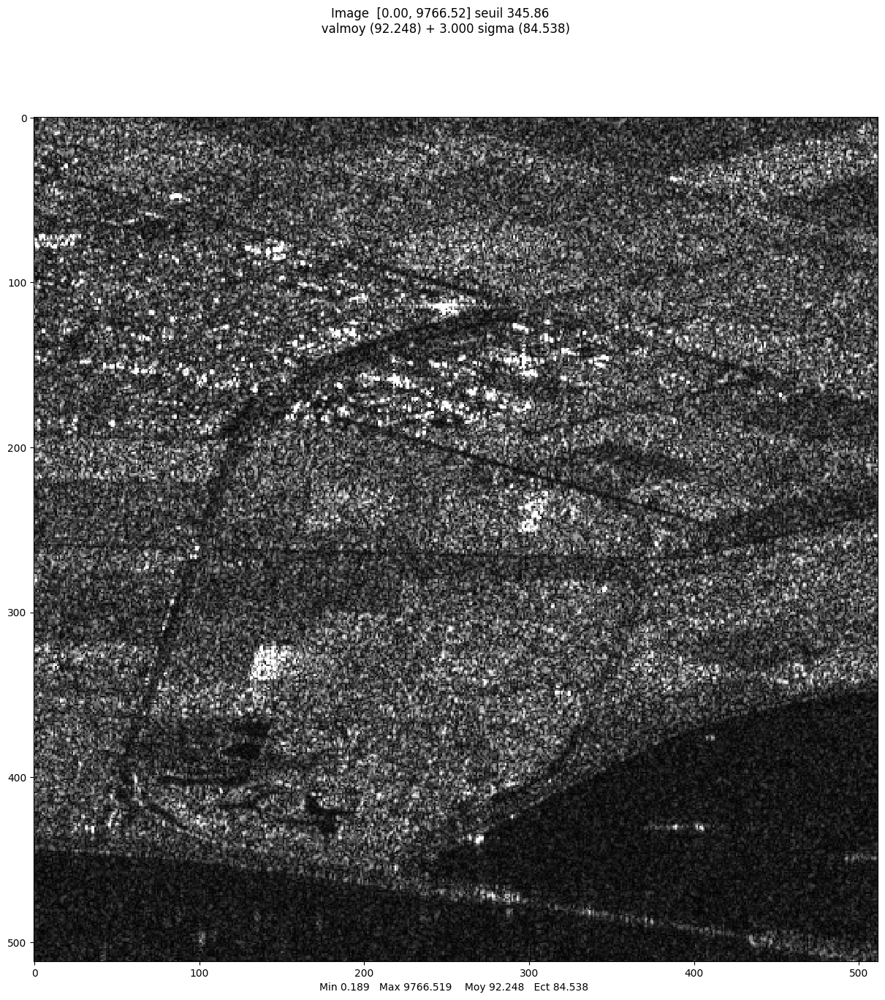

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


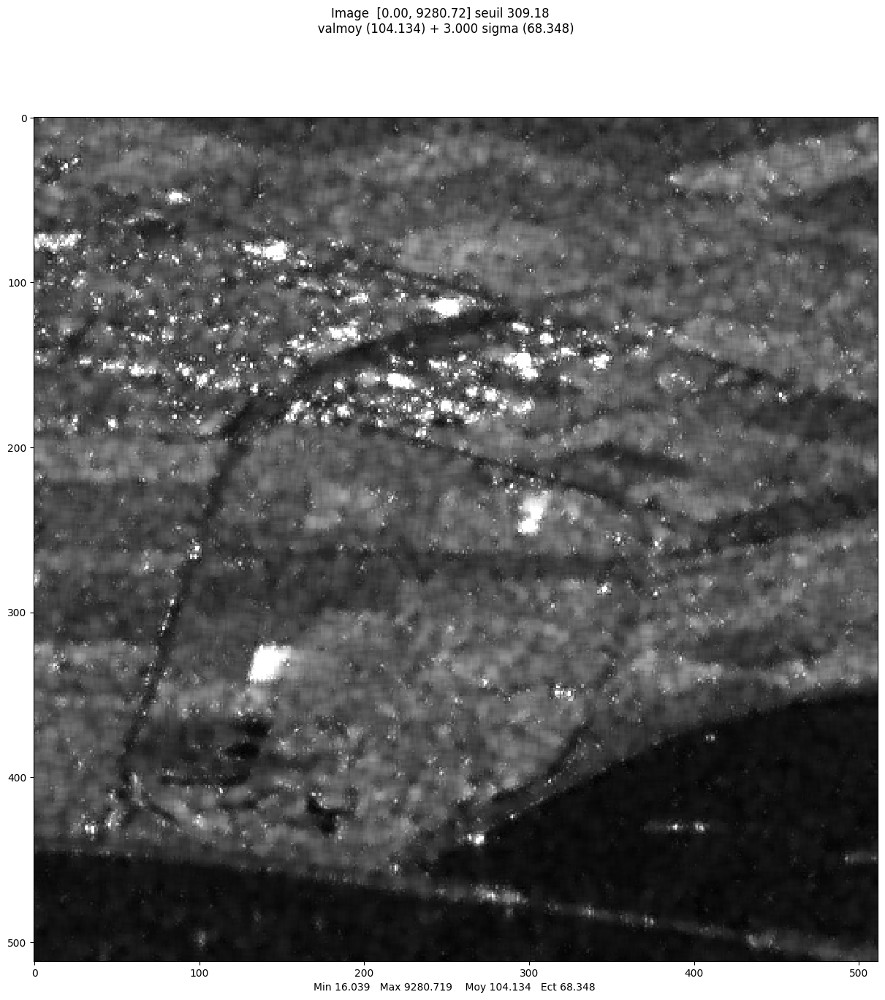

array([[ 81.14314641,  86.70792346, 104.114656  , ...,  86.38397863,
         83.34771966,  90.51879881],
       [ 73.70455815,  90.55680742,  83.92257051, ..., 106.70802265,
         87.51445849,  85.09064994],
       [ 81.06037018,  98.90262251,  92.39103074, ..., 108.88890373,
        109.87183208,  83.60564062],
       ...,
       [ 38.33386913,  38.91783253,  38.92604521, ...,  80.87993632,
         81.65279989,  86.34539786],
       [ 35.3068932 ,  36.14287688,  36.87108667, ...,  75.95673009,
         73.68493674,  79.73138404],
       [ 30.51428703,  30.59066658,  30.72023404, ...,  74.66701645,
         71.47608764,  78.92100107]])

In [20]:
part_lely_slc = mvalab.imz2mat('lely_tuple_multitemp.IMA')[0] #date is on thrid axis of part_lely_slc
part_lely_slc = part_lely_slc[:,:,0] #single look complex image

part_lely_int = np.abs(part_lely_slc)**2  # Convert to intensity if needed
lee_filtered_lely = lee_filter(part_lely_int, neighborhood=7, L=1, visualize=False)


mvalab.visusar(np.sqrt(part_lely_int))
mvalab.visusar(np.sqrt(lee_filtered_lely))

--2024-06-11 15:35:36--  https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.IMA
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 137.194.22.227, 2a04:8ec0:0:a::89c2:16e3
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|137.194.22.227|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 26214400 (25M)
Saving to: ‘lely_tuple_multitemp_SAR2SAR.IMA.1’

lely_tuple_multitem 100%[===================>]  25.00M  12.3MB/s    in 2.0s    

2024-06-11 15:35:39 (12.3 MB/s) - ‘lely_tuple_multitemp_SAR2SAR.IMA.1’ saved [26214400/26214400]

--2024-06-11 15:35:39--  https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.dim
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 137.194.22.227, 2a04:8ec0:0:a::89c2:16e3
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|137.194.22.227|:443... connected.
HTTP request

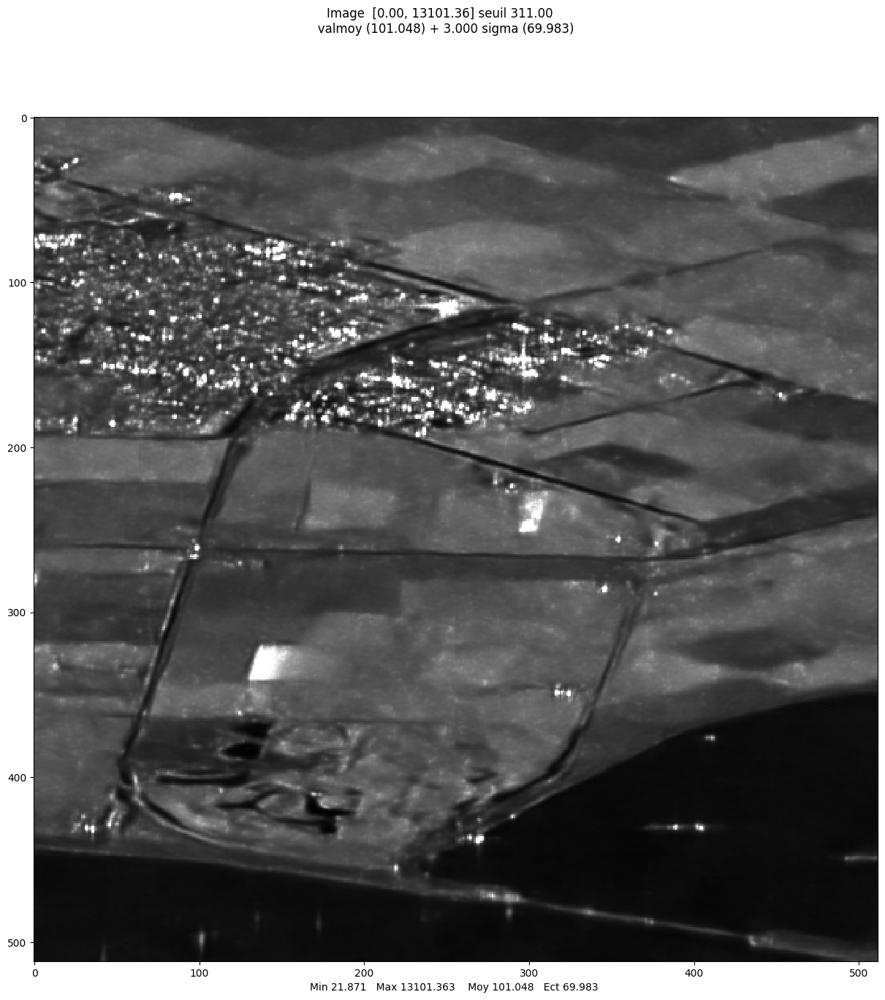

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


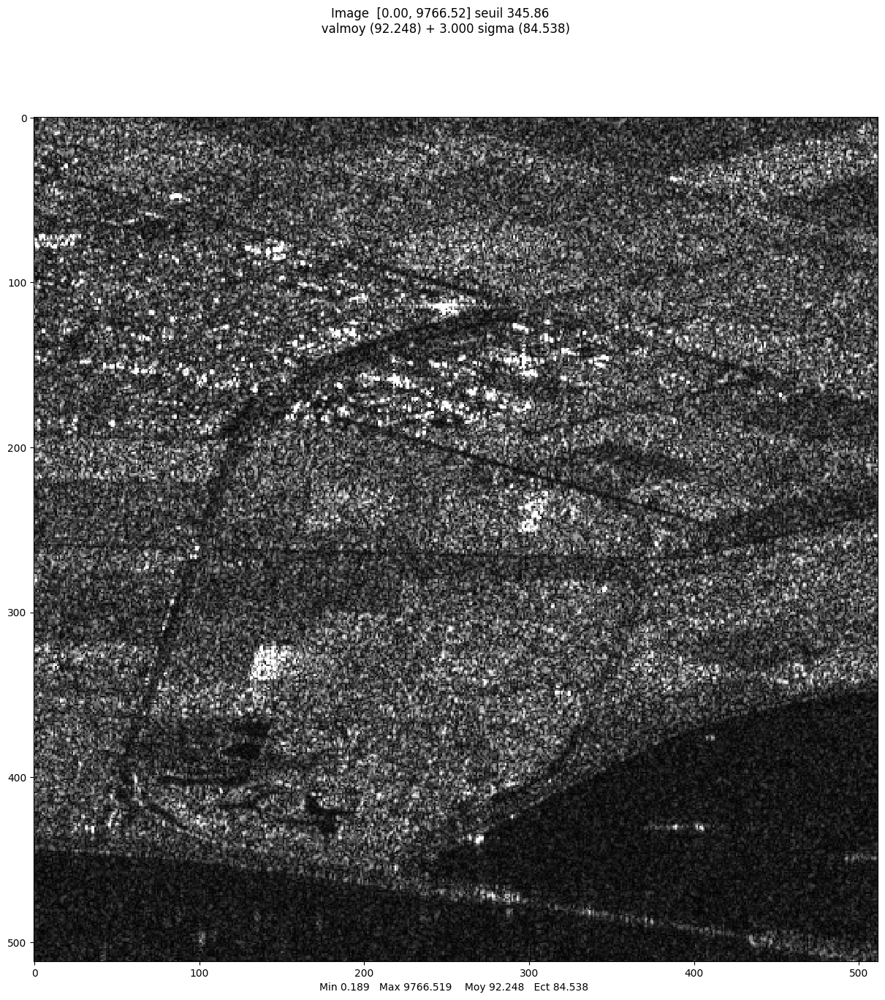

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


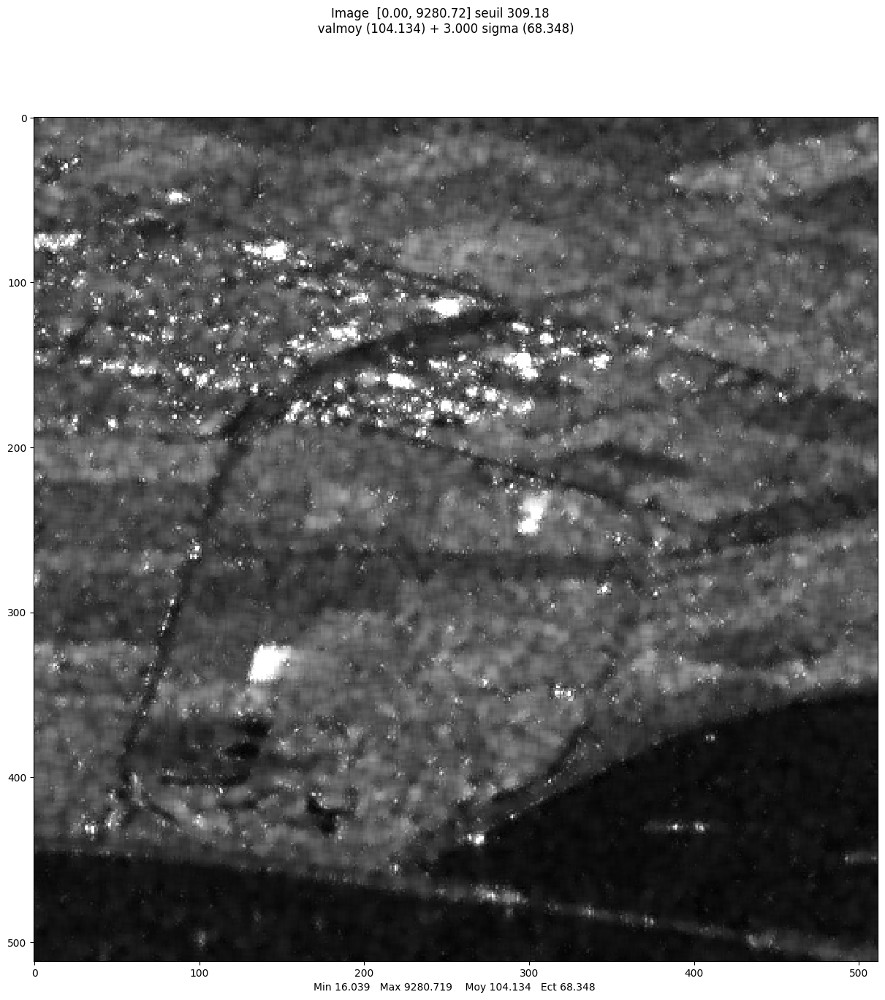

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


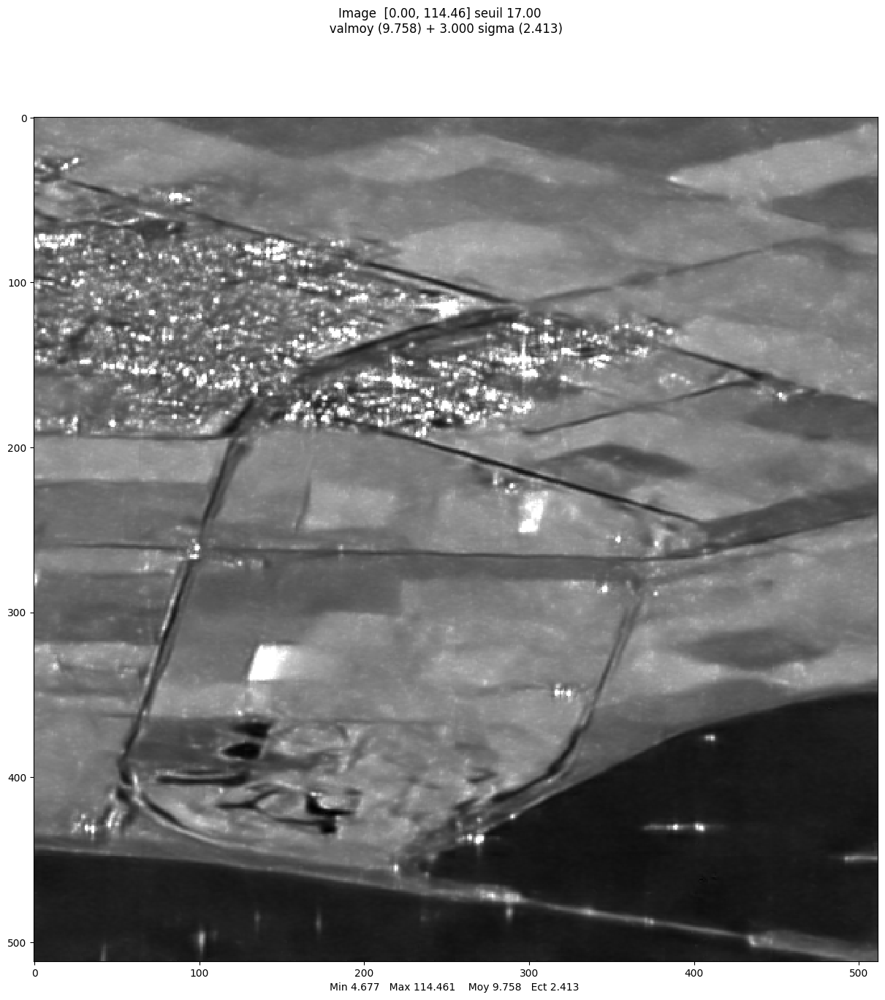

array([[10.40516011, 10.43675878, 10.82645675, ...,  9.33484074,
         9.47584917,  9.47402857],
       [10.27353107, 10.54786671, 10.77745241, ...,  9.75902941,
         9.80815388,  9.77674796],
       [10.28221019, 10.69079753, 10.79352399, ..., 10.02956483,
        10.03903894, 10.01137925],
       ...,
       [ 6.34904342,  6.23538544,  6.17240343, ...,  9.09737489,
         9.02720261,  9.04623532],
       [ 6.32420186,  6.20798162,  6.24198338, ...,  9.1882984 ,
         9.16857331,  9.14578889],
       [ 6.37910569,  6.21218664,  6.21441162, ...,  9.01169843,
         9.06117733,  9.35216294]])

In [22]:
# this image has already been processed by a CNN based filter
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.IMA
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.dim
im_lely_multitemp_denoised = mvalab.imz2mat('lely_tuple_multitemp_SAR2SAR.IMA')
im1_d = np.abs(im_lely_multitemp_denoised[0][:,:,0]) #amplitude
mvalab.visusar(im1_d)

lee_filtered_lely = lee_filter(part_lely_int, neighborhood=7, L=1, visualize=False)

mvalab.visusar(np.sqrt(part_lely_int))
mvalab.visusar(np.sqrt(lee_filtered_lely))
mvalab.visusar(np.sqrt(im1_d))

### Question C.4
Do a comparison between the CNN filtering and the Lee filter. Comment the two results. Are homogeneous areas well restored? Do the methods preserve edges and fine structures? Are artifacts introduced?

### Answer C.4

**Comparison Summary:**

- **Noise Suppression:**
  - **Lee Filter:** Effectively smooths homogeneous areas but may leave some residual noise.
  - **SAR2SAR:** Provides superior noise reduction, resulting in cleaner, more uniform regions.

- **Edge and Structure Preservation:**
  - **Lee Filter:** Preserves edges and fine structures reasonably well but can cause some blurring.
  - **SAR2SAR:** Excels in maintaining sharpness and detail with minimal blurring.

- **Artifacts:**
  - **Lee Filter:** Generally does not introduce significant artifacts but may slightly blur fine details.
  - **SAR2SAR:** Produces clean images with well-preserved details and sharp edges, introducing few to no artifacts.

## C.5 Method noise
Performances of a denoising algorithm can be visually interpreted by looking at the *residual noise* (i.e. the ratio between the noisy image and the denoised image, in intensity). For a quantitative evaluation, we can look at the noise statistics, knowing that, in intensity, statistics of speckle S are:
- $\mu_S=1$
- $\sigma^2_S = \frac{1}{L}$

### Question C.5
Compute the aforementioned ratio image, mean value and variance for the image restored using the Lee filter and the result of SAR2SAR. Comment the results.

What is the interest of computing the method noise ? What are your conclusions for the two previous filters ?

### Answer C.5

### Comments and Conclusions

**Interest of Computing Method Noise:**
- **Performance Evaluation:** Method noise helps assess the effectiveness of denoising algorithms by showing how much noise remains after filtering.
- **Algorithm Comparison:** It allows for a quantitative comparison of different algorithms in terms of noise suppression and feature preservation.

**Conclusions for the Two Filters:**
- **Lee Filter:**
  - **Mean and Variance:** If the mean is close to 1 and the variance is low, the Lee filter effectively reduces noise while maintaining the original signal characteristics.
  - **Visual Inspection:** Residual noise should be low and uniformly distributed, indicating effective noise reduction.

- **SAR2SAR:**
  - **Mean and Variance:** A mean close to 1 and a lower variance compared to the Lee filter indicate superior noise suppression and better preservation of image details.
  - **Visual Inspection:** The residual noise image should be cleaner with fewer artifacts, demonstrating the advanced capabilities of SAR2SAR in denoising.

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


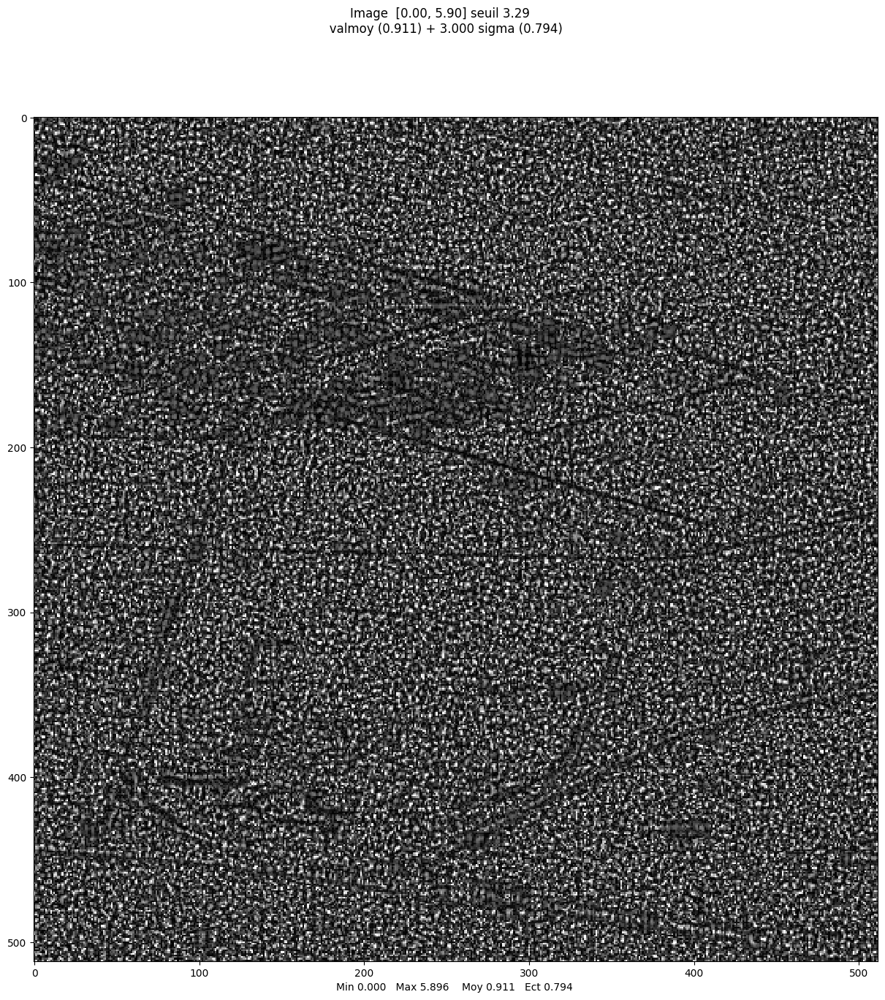

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


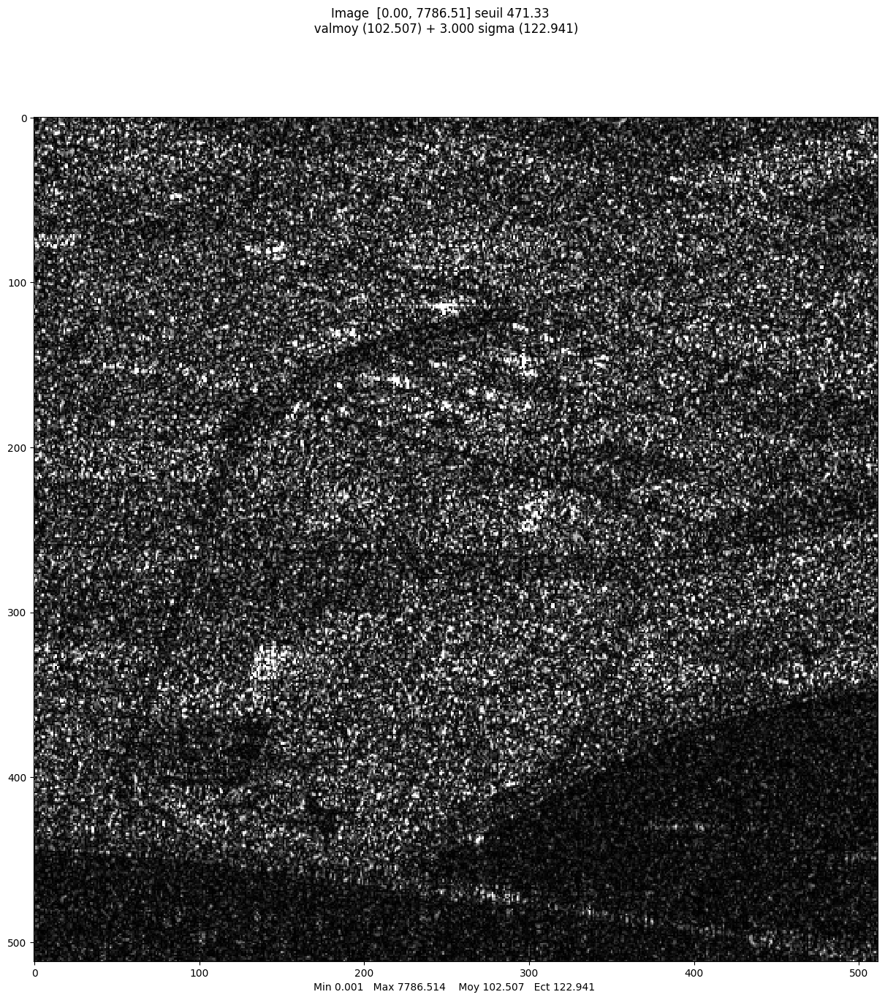

LEE FILTER: mean = 0.9109006966520314 and var = 0.630298886991704
SAR2SAR: mean = 102.50694511619228 and var = 15114.57611953478


In [23]:
# Plot the residual noise
res_noise_lee = part_lely_int / lee_filtered_lely
res_noise_deep = part_lely_int / im1_d

mvalab.visusar(res_noise_lee)
mvalab.visusar(res_noise_deep)

mean_lee = np.mean(res_noise_lee)
var_lee = np.var(res_noise_lee)

mean_deep = np.mean(res_noise_deep)
var_deep = np.var(res_noise_deep)

# Print the results
print('LEE FILTER: mean = ' + str(mean_lee) + ' and var = ' + str(var_lee))
print('SAR2SAR: mean = ' + str(mean_deep) + ' and var = ' + str(var_deep))